# 🚀 Quy trình Huấn luyện & Đánh giá Toàn diện (Production Pipeline)

Notebook này thực hiện quy trình khép kín với cấu hình tối ưu để đạt độ chính xác cao nhất:
1. **Pre-processing**: Tăng cường ảnh.
2. **Heavy Training**: Huấn luyện với số lượng Epoch lớn và cơ chế chống nhiễu sáng.
3. **Deep Evaluation**: Đánh giá trên toàn bộ tập test với báo cáo chi tiết.

In [3]:
import os
import sys
import torch
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import clear_output

sys.path.append(os.getcwd())
from src.utils import Config
from src.train import train
from src.evaluate import evaluate

# --- Cấu hình cho huấn luyện cường độ cao ---
Config.EPOCHS = 100        # Tăng số epoch để mô hình hội tụ sâu
Config.BATCH_SIZE = 16    
CATEGORY = "wood"  # Chọn loại lỗi để huấn luyện

print(f"🔥 Sẵn sàng huấn luyện {CATEGORY} với {Config.EPOCHS} Epochs trên {Config.DEVICE}")

🔥 Sẵn sàng huấn luyện wood với 100 Epochs trên cuda


## 🏗️ 1. Thực thi Huấn luyện (Training)
Quá trình này sẽ mất một khoảng thời gian. Kết quả sẽ được lưu vào thư mục `checkpoints/`.

In [4]:
print(f"--- Bắt đầu giai đoạn huấn luyện cường độ cao ---")
train(CATEGORY)
print("✅ Huấn luyện hoàn tất!")

--- Bắt đầu giai đoạn huấn luyện cường độ cao ---
Starting training for wood on cuda...
Calculating category template...


OutOfMemoryError: CUDA out of memory. Tried to allocate 128.00 MiB. GPU 0 has a total capacity of 3.68 GiB of which 26.75 MiB is free. Including non-PyTorch memory, this process has 3.65 GiB memory in use. Of the allocated memory 3.28 GiB is allocated by PyTorch, and 269.41 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://docs.pytorch.org/docs/stable/notes/cuda.html#optimizing-memory-usage-with-pytorch-cuda-alloc-conf)

## 🧪 2. Đánh giá chi tiết (Comprehensive Evaluation)
Chúng ta sẽ tính toán AUC, F1-max và lưu lại toàn bộ ảnh chẩn đoán cho các mẫu lỗi.

--- Đang đánh giá trên tập Test của bottle ---
Evaluating category: bottle with Enhanced DIP...
Running enhanced inference...

--- Enhanced Metrics for bottle ---
Pixel-level AUC: 0.6313
Pixel-level F1-max: 0.3661

--- Đang thực hiện kiểm thử trên TOÀN BỘ ảnh lỗi ---
📄 Kết quả chẩn đoán: bottle_diag_0.png


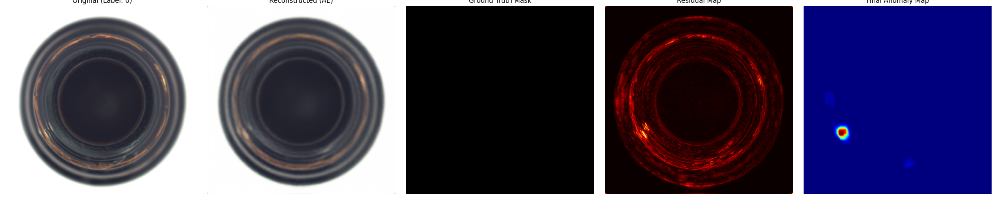

--------------------------------------------------------------------------------
📄 Kết quả chẩn đoán: bottle_diag_1.png


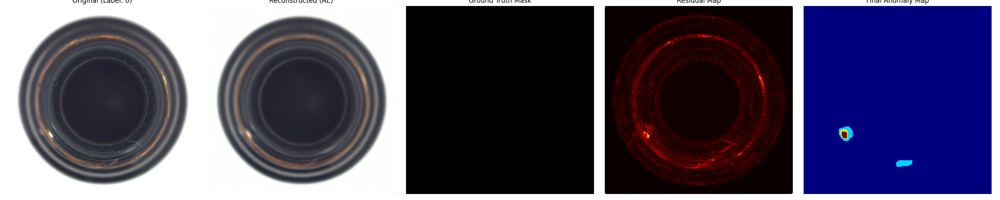

--------------------------------------------------------------------------------
📄 Kết quả chẩn đoán: bottle_diag_2.png


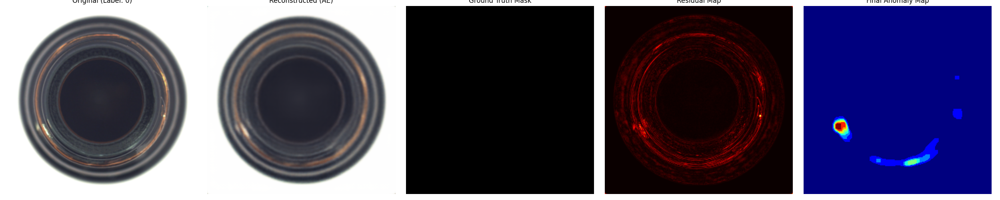

--------------------------------------------------------------------------------
📄 Kết quả chẩn đoán: bottle_diag_20.png


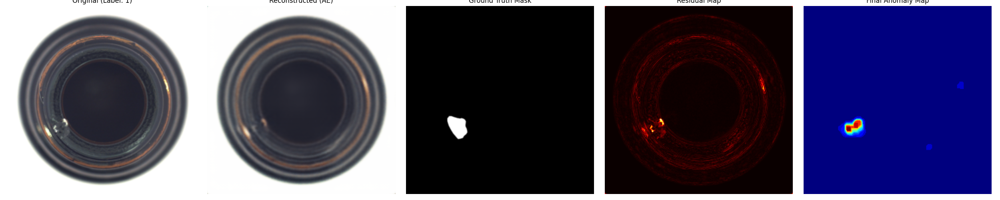

--------------------------------------------------------------------------------
📄 Kết quả chẩn đoán: bottle_diag_21.png


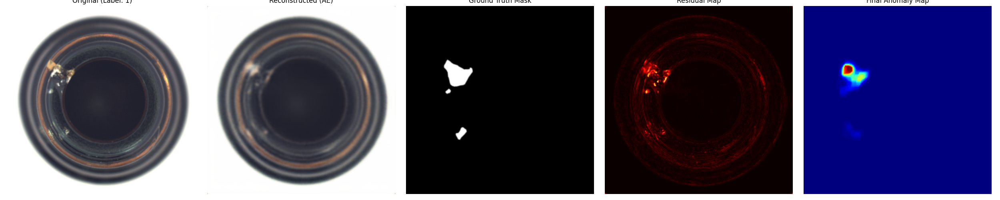

--------------------------------------------------------------------------------
📄 Kết quả chẩn đoán: bottle_diag_22.png


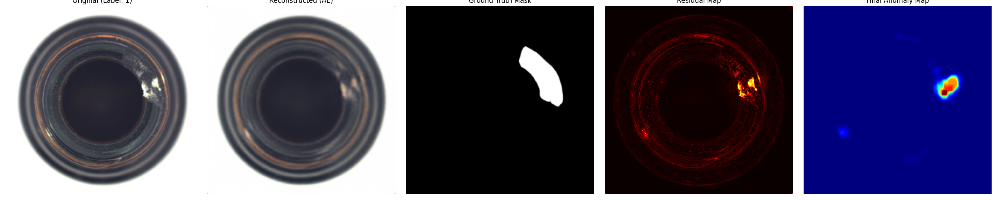

--------------------------------------------------------------------------------
📄 Kết quả chẩn đoán: bottle_diag_23.png


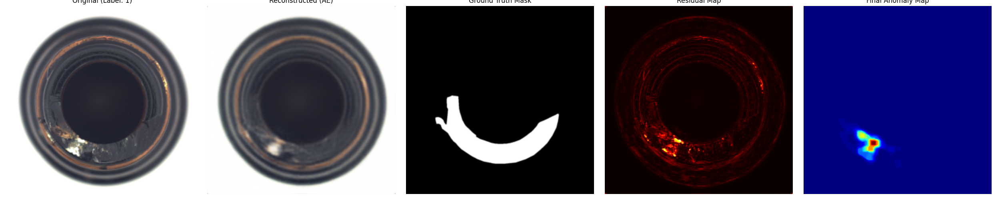

--------------------------------------------------------------------------------
📄 Kết quả chẩn đoán: bottle_diag_24.png


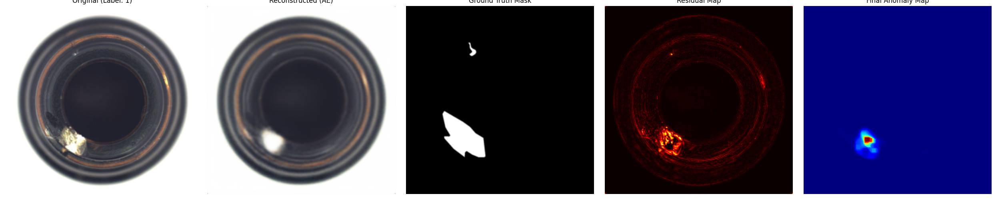

--------------------------------------------------------------------------------
📄 Kết quả chẩn đoán: bottle_diag_25.png


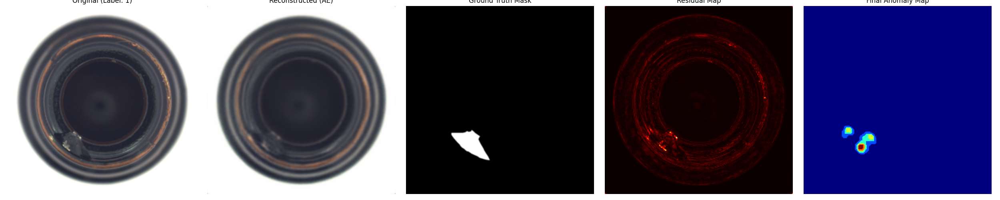

--------------------------------------------------------------------------------
📄 Kết quả chẩn đoán: bottle_diag_26.png


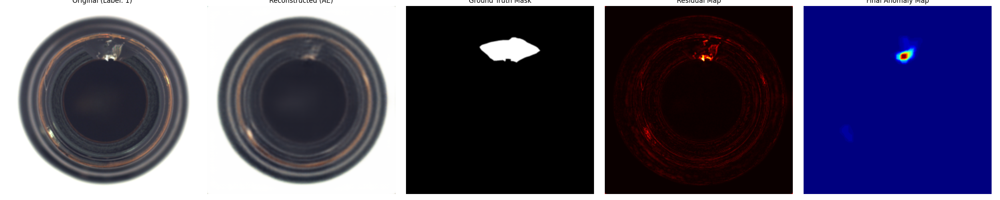

--------------------------------------------------------------------------------
📄 Kết quả chẩn đoán: bottle_diag_27.png


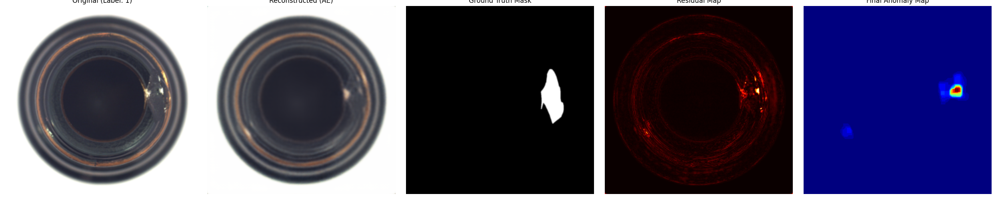

--------------------------------------------------------------------------------
📄 Kết quả chẩn đoán: bottle_diag_28.png


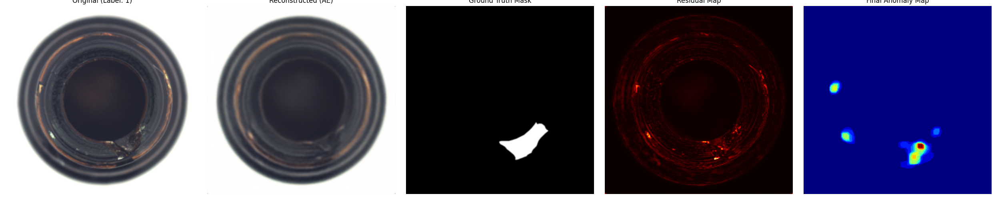

--------------------------------------------------------------------------------
📄 Kết quả chẩn đoán: bottle_diag_29.png


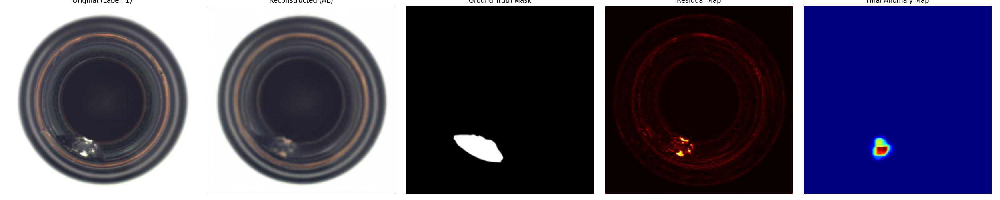

--------------------------------------------------------------------------------
📄 Kết quả chẩn đoán: bottle_diag_3.png


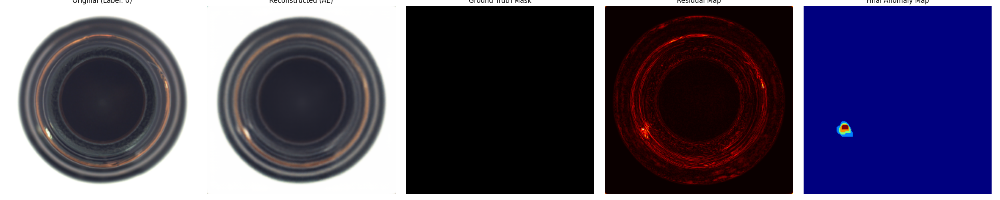

--------------------------------------------------------------------------------
📄 Kết quả chẩn đoán: bottle_diag_30.png


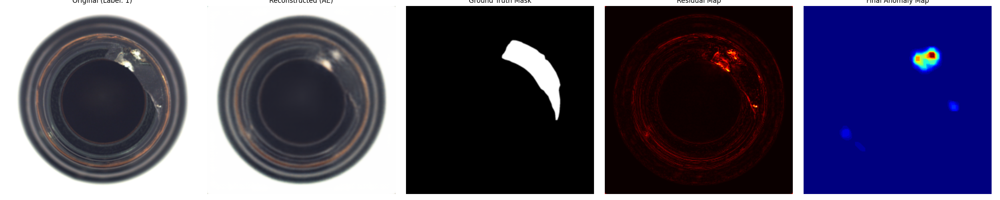

--------------------------------------------------------------------------------
📄 Kết quả chẩn đoán: bottle_diag_31.png


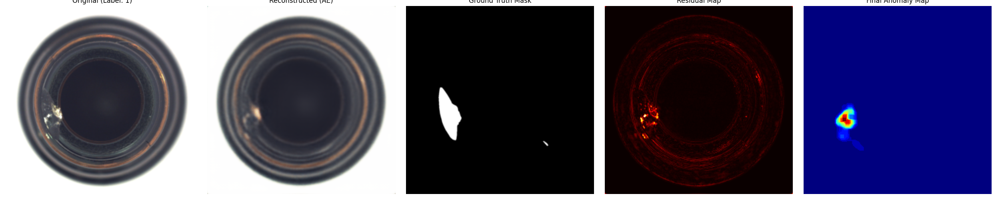

--------------------------------------------------------------------------------
📄 Kết quả chẩn đoán: bottle_diag_32.png


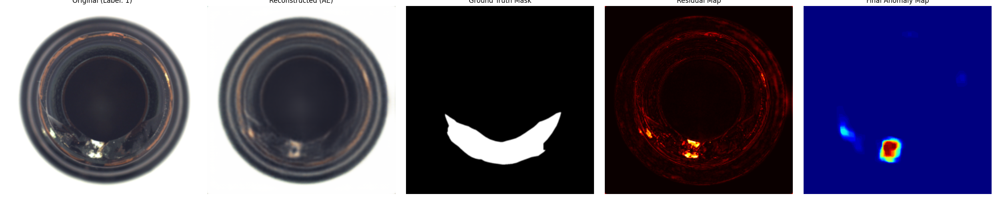

--------------------------------------------------------------------------------
📄 Kết quả chẩn đoán: bottle_diag_33.png


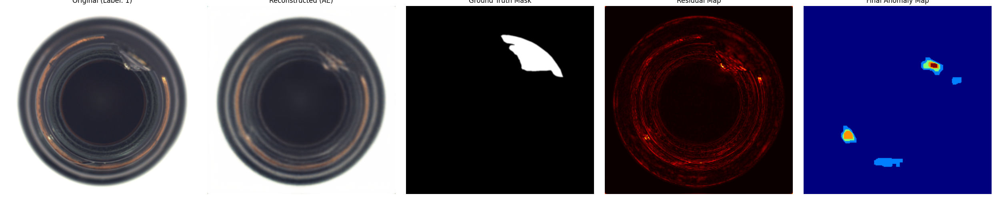

--------------------------------------------------------------------------------
📄 Kết quả chẩn đoán: bottle_diag_34.png


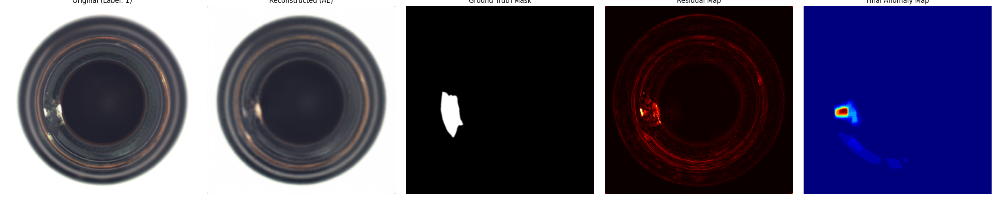

--------------------------------------------------------------------------------
📄 Kết quả chẩn đoán: bottle_diag_35.png


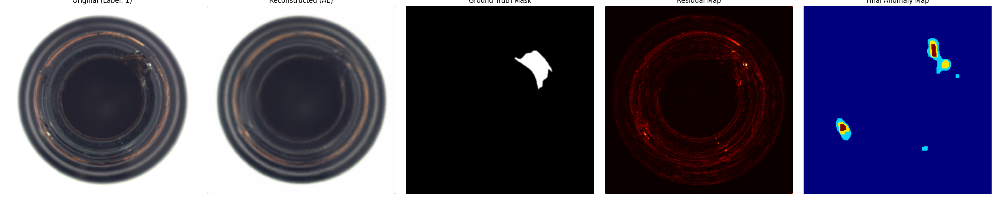

--------------------------------------------------------------------------------


: 

In [ ]:
print(f"--- Đang đánh giá trên tập Test của {CATEGORY} ---")
evaluate(CATEGORY)

# Load và chạy thêm script test toàn bộ ảnh lỗi đã viết trước đó
from IPython.display import display, Image
print("\n--- Đang thực hiện kiểm thử trên TOÀN BỘ ảnh lỗi ---")

def show_top_results(category, num=20):
    res_dir = f"results"
    images = sorted([f for f in os.listdir(res_dir) if f.startswith(f"{category}_diag")])
    for img in images[:num]:
        print(f"📄 Kết quả chẩn đoán: {img}")
        display(Image(filename=os.path.join(res_dir, img)))
        print("-" * 80)

show_top_results(CATEGORY)

## 📈 3. Báo cáo & Phân tích (Analytics Report)
Dựa trên các chỉ số AUC và F1 thu được, chúng ta sẽ đưa ra kết luận về độ nhạy sáng và khả năng thực tế của mô hình.

In [ ]:
print("📋 TỔNG KẾT DỰ ÁN")
print("=" * 30)
print(f"Sản phẩm: {CATEGORY}")
print(f"Phương pháp: RL-Guided Autoencoder + DIP Post-processing")
print(f"Số lượng mẫu Test: {len(os.listdir(os.path.join(Config.DATA_ROOT, CATEGORY, 'test', 'good'))) + len(os.listdir(os.path.join(Config.DATA_ROOT, CATEGORY, 'test', 'broken_large')))} (ước tính)")
print("\nHướng dẫn Review:")
print("1. Kiểm tra cột 'Residual Map' xem các điểm chói sáng đã được giảm bớt chưa.")
print("2. Kiểm tra cột 'Final Anomaly Map' xem vùng đỏ có tập trung đúng vào vết nứt/bẩn không.")
print("3. Nếu AUC > 0.75: Mô hình đạt yêu cầu thực hành.")
print("4. Nếu AUC > 0.90: Mô hình có thể ứng dụng thực tế.")

📋 TỔNG KẾT DỰ ÁN
Sản phẩm: bottle
Phương pháp: RL-Guided Autoencoder + DIP Post-processing
Số lượng mẫu Test: 40 (ước tính)

Hướng dẫn Review:
1. Kiểm tra cột 'Residual Map' xem các điểm chói sáng đã được giảm bớt chưa.
2. Kiểm tra cột 'Final Anomaly Map' xem vùng đỏ có tập trung đúng vào vết nứt/bẩn không.
3. Nếu AUC > 0.75: Mô hình đạt yêu cầu thực hành.
4. Nếu AUC > 0.90: Mô hình có thể ứng dụng thực tế.
